# Look for more interesting convolutions

In this notebook, one single convolutional layer is still used. However, the number of units is increased to 16. This is done to see if the model can learn to focus on something different than just edges.

In [13]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from tensorflow import keras
from keras.models import Model
import tensorflow as tf

import src.config as config
from src.dataloader import read_train, read_val
from src.preprocessing import CustomDataGenerator
from src.results import plot_history, plot_cm, class_report, save_params

OUTPUT_FOLDER = 'notebooks/experiments/improve_classifier_2conv_1_dense/output/'

LEARNING_RATE = 0.001
BATCH_SIZE = 64
EPOCHS = 15

save_params(OUTPUT_FOLDER, lr=LEARNING_RATE, bs=BATCH_SIZE, ep=EPOCHS)

In [5]:
X_train, y_train = read_train()
print(X_train.shape, y_train.shape)

X_val, y_val = read_val()
print(X_val.shape, y_val.shape)

output_shape = len(config.LABELS)

(20300, 256, 256, 3) (20300,)
(1450, 256, 256, 3) (1450,)


In [14]:
layers = [
    keras.Input(shape=(config.IMG_SIZE, config.IMG_SIZE, config.N_CHANNELS)),
    keras.layers.Rescaling(1./255.),
    keras.layers.Conv2D(16,(3,3), activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = (4, 4)),
    keras.layers.Conv2D(32,(3,3), activation = 'relu'),
    keras.layers.MaxPooling2D(pool_size = (4, 4)),
    # keras.layers.Conv2D(256,(3,3), activation = 'relu'),
    # keras.layers.MaxPooling2D(pool_size = (4, 4)),

    keras.layers.Flatten(),
    # keras.layers.Dense(512, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(output_shape, activation='softmax')
]

model = keras.Sequential(layers)
'''
sparse_categorical_crossentropy para cuando las categorias vienen en una unica columna
categorical_crossentropy para cuando las categorias vienen en formato dummy
'''
model.compile(optimizer=keras.optimizers.legacy.Adam(learning_rate=LEARNING_RATE),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 15, 15, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 7200)              0

In [15]:
np.random.seed(0)
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3, min_delta=0.01)

train_generator = CustomDataGenerator(X_train, y_train, batch_size=BATCH_SIZE)
model.fit(train_generator, epochs=EPOCHS, validation_data=(X_val, y_val), 
            callbacks=[callback])
model.save(OUTPUT_FOLDER+f'model.h5')

Epoch 1/15
318/318 [==============================] - 22s 69ms/step - loss: 2.3744 - accuracy: 0.2956 - val_loss: 1.9181 - val_accuracy: 0.4207
Epoch 2/15
318/318 [==============================] - 22s 69ms/step - loss: 1.7710 - accuracy: 0.4654 - val_loss: 1.7011 - val_accuracy: 0.4524
Epoch 3/15
318/318 [==============================] - 22s 69ms/step - loss: 1.5392 - accuracy: 0.5320 - val_loss: 1.5632 - val_accuracy: 0.5221
Epoch 4/15
318/318 [==============================] - 22s 69ms/step - loss: 1.3627 - accuracy: 0.5848 - val_loss: 1.5166 - val_accuracy: 0.5338
Epoch 5/15
318/318 [==============================] - 22s 69ms/step - loss: 1.2219 - accuracy: 0.6299 - val_loss: 1.3784 - val_accuracy: 0.5828
Epoch 6/15
318/318 [==============================] - 22s 69ms/step - loss: 1.1125 - accuracy: 0.6590 - val_loss: 1.3472 - val_accuracy: 0.5869
Epoch 7/15
318/318 [==============================] - 22s 69ms/step - loss: 1.0040 - accuracy: 0.6947 - val_loss: 1.3168 - val_accuracy:

/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


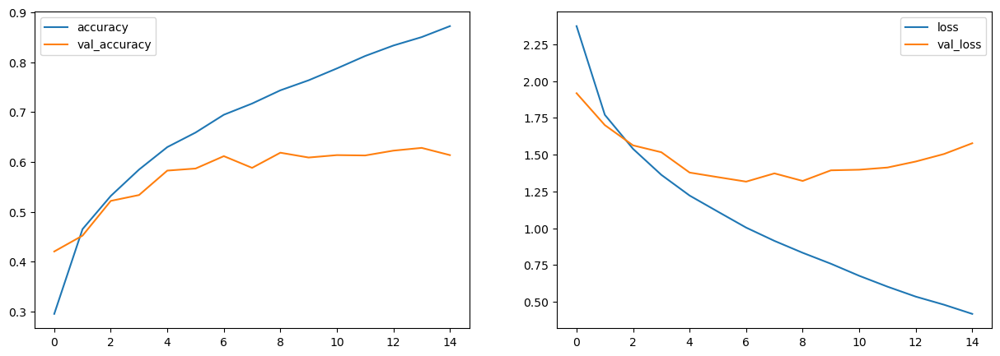

In [16]:
fig = plot_history(model)
fig.savefig(OUTPUT_FOLDER+f'history_lr_{LEARNING_RATE}_bs_{BATCH_SIZE}_ep_{EPOCHS}.png')

/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


                        precision    recall  f1-score   support

    Albumen photograph       0.86      0.84      0.85        50
                Bronze       0.48      0.40      0.43        50
               Ceramic       0.49      0.58      0.53        50
                  Clay       0.63      0.72      0.67        50
             Engraving       0.45      0.42      0.43        50
               Etching       0.49      0.50      0.50        50
               Faience       0.80      0.72      0.76        50
                 Glass       0.42      0.64      0.50        50
                  Gold       0.78      0.80      0.79        50
              Graphite       0.72      0.88      0.79        50
Hand-colored engraving       0.91      0.86      0.89        50
  Hand-colored etching       0.95      0.74      0.83        50
                  Iron       0.55      0.76      0.64        50
                 Ivory       0.62      0.40      0.49        50
             Limestone       0.36      

,name,train_acc,val_acc,time_per_epoch_s
0,1 Conv 16 + 1 Conv 32 + 1 Dense 64,0.901232,0.613793,21


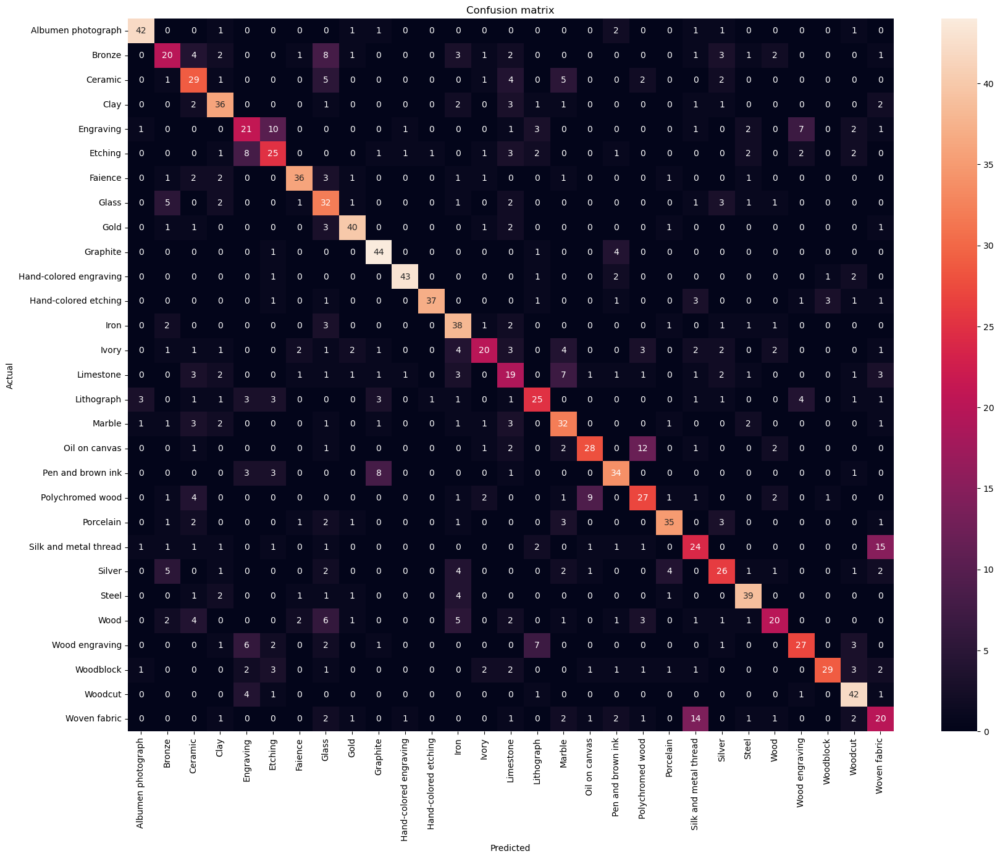

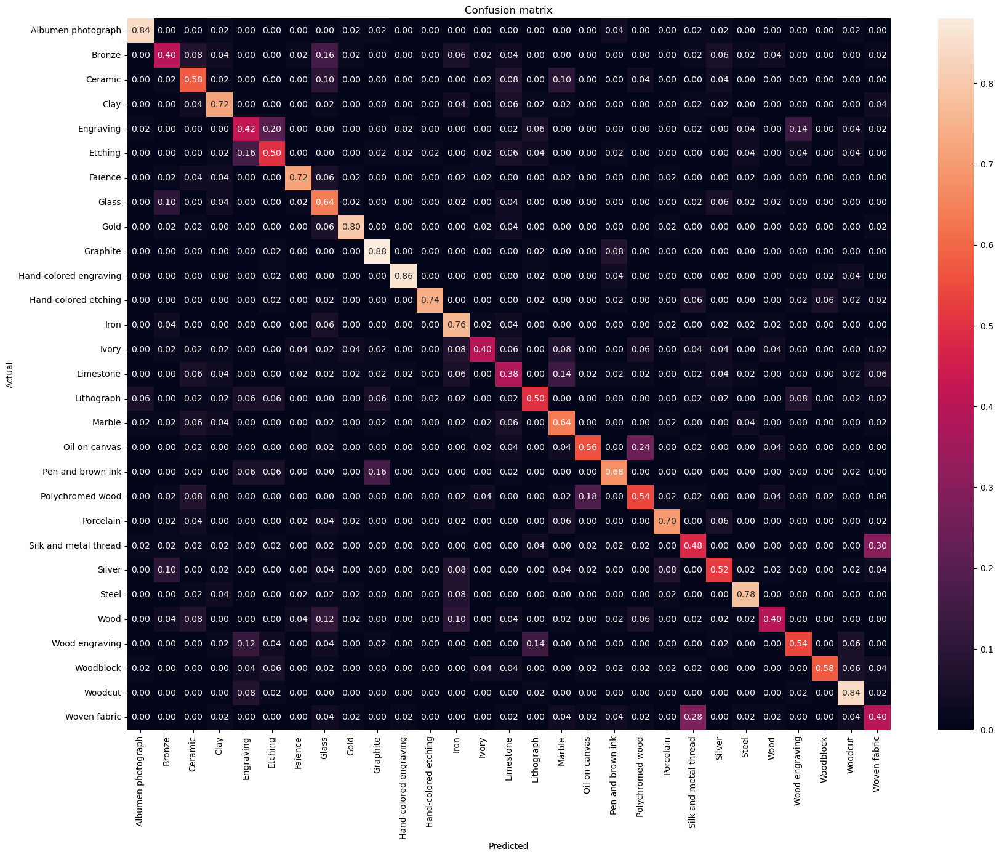

In [17]:
model = keras.models.load_model(OUTPUT_FOLDER+'model.h5')

y_prob = model.predict(X_val, verbose=0)
y_pred = np.argmax(y_prob, axis=1)

fig = plot_cm(y_val, y_pred, labels=config.LABELS)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix.jpg')

fig = plot_cm(y_val, y_pred, labels=config.LABELS, pct=True)
fig.savefig(OUTPUT_FOLDER+'confusion_matrix_pct.jpg')

report = class_report(y_val, y_pred, out_path=OUTPUT_FOLDER)

acc_train = model.evaluate(X_train, y_train, verbose=0)[1]
acc_val = model.evaluate(X_val, y_val, verbose=0)[1]

d_results = {"name": "1 Conv 16 + 1 Conv 32 + 1 Dense 64",
             "train_acc": acc_train,
             "val_acc": acc_val,
             "time_per_epoch_s": 21}

df_results = pd.DataFrame(d_results, index=[0])
df_results.to_csv(OUTPUT_FOLDER+'metrics.csv', index=False)
df_results.head()

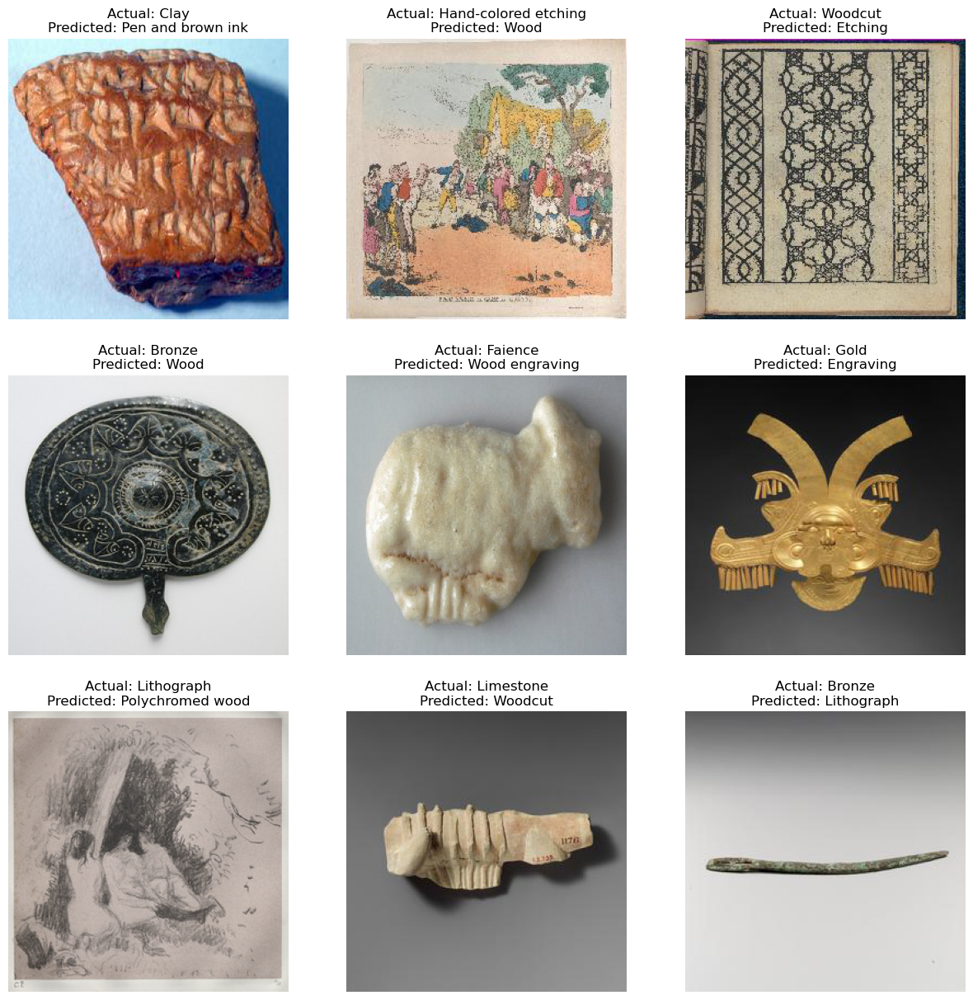

In [22]:
# Get the indices of wrong predictions
wrong_idx = np.where(y_val != y_pred)[0]

# Plot some of the wrong predictions
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, idx in enumerate(wrong_idx[:9]):
    img = X_train[idx]
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {config.LABELS[y_train[idx]]}\nPredicted: {config.LABELS[y_pred[idx]]}')
    ax[i//3, i%3].axis('off')
plt.show()


In [34]:
Activations[5].shape

(1, 13, 13, 64)

1/1 [==============================] - 0s 45ms/step


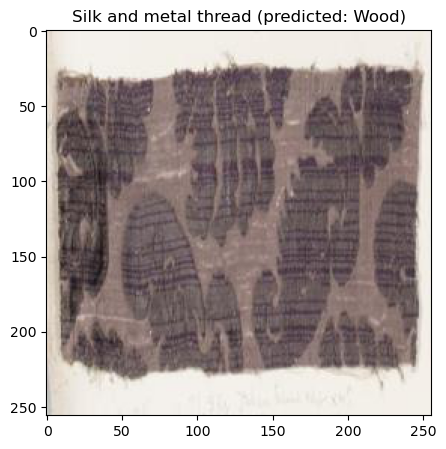

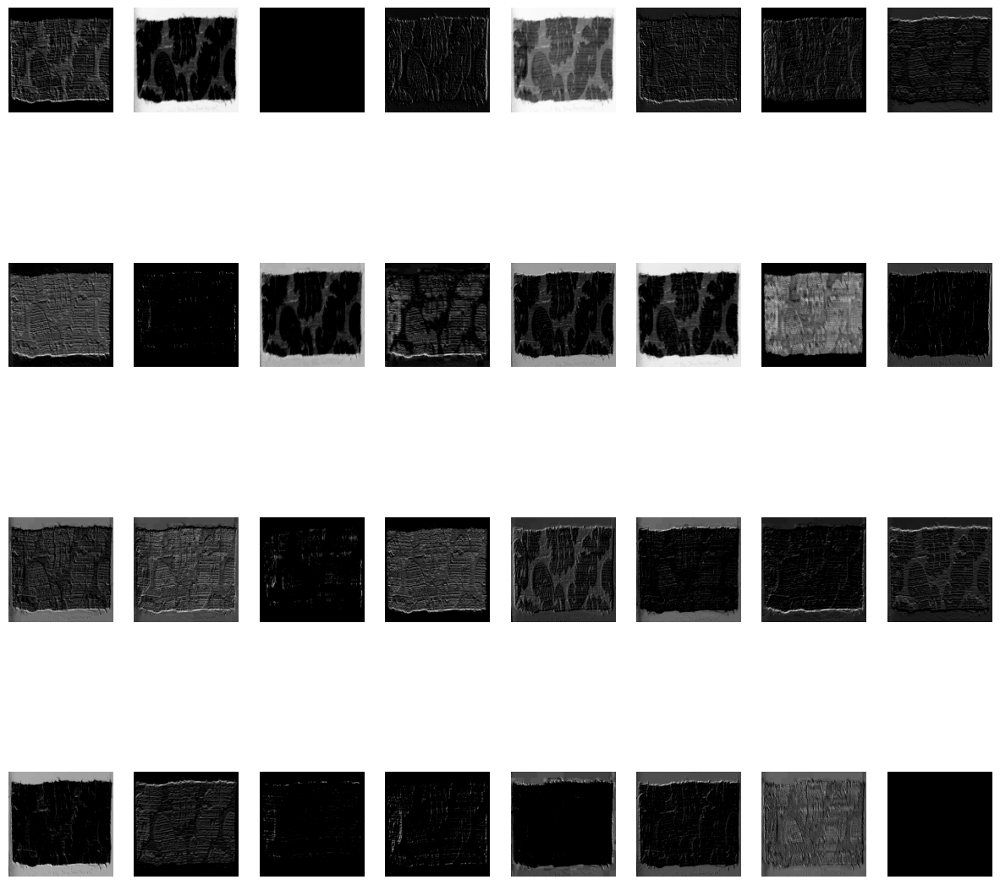

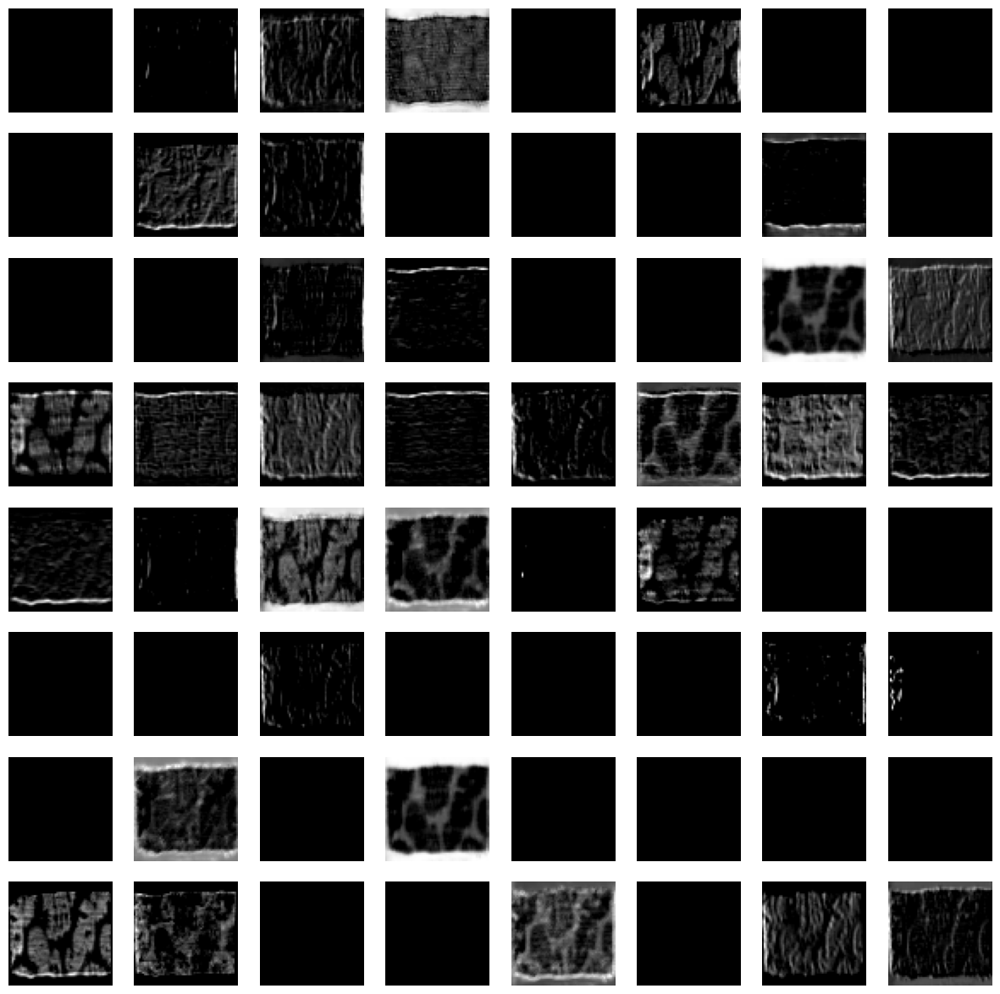

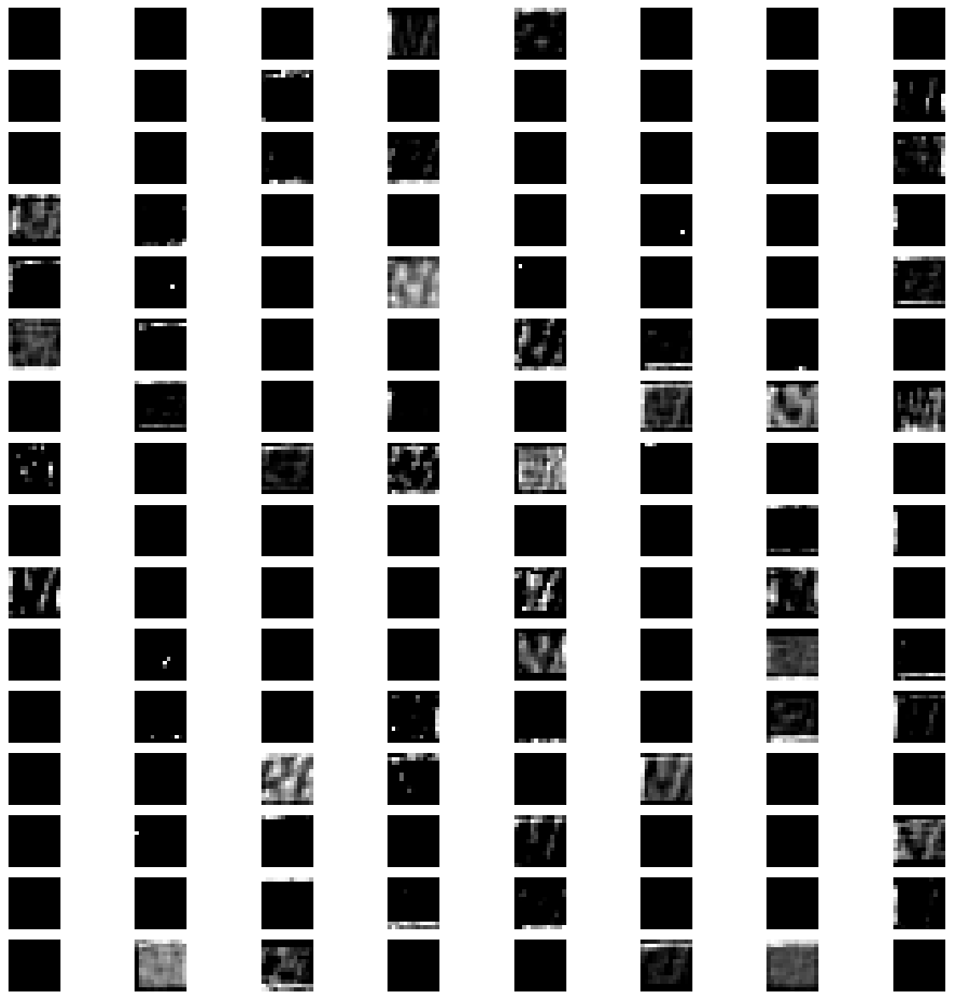

In [23]:
# Import model from kerasa
from keras.models import Model

k = 1
fig, ax = plt.subplots(1,1, figsize=(5,5))
ax.imshow(X_val[k, :, :])
ax.set_title(f"{config.LABELS[y_val[k]]} (predicted: {config.LABELS[y_pred[k]]})")

Image_Tensor = X_val[k, :, :].astype(float)
Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)
# Image_Tensor = Image_Tensor/255.0

# Extract the Model Outputs for all the Layers
Model_Outputs = [layer.output for layer in model.layers]
# Create a Model with Model Input as Input and the Model Outputs as Output
Activation_Model = Model(model.input, Model_Outputs)
Activations = Activation_Model.predict(Image_Tensor)

fig, ax = plt.subplots(4, 8, figsize=(15, 15))
ax = ax.ravel()

for i in range(32):
    ax[i].imshow(Activations[1][0, :, :, i], cmap='gray')
    ax[i].axis('off')

plt.show()

fig, ax = plt.subplots(8, 8, figsize=(15, 15))
ax = ax.ravel()

for i in range(64):
    ax[i].imshow(Activations[3][0, :, :, i], cmap='gray')
    ax[i].axis('off')

plt.show()

fig, ax = plt.subplots(16, 8, figsize=(15, 15))
ax = ax.ravel()

for i in range(128):
    ax[i].imshow(Activations[5][0, :, :, i], cmap='gray')
    ax[i].axis('off')

plt.show()

they are still quite simple features, but they are not just edges.

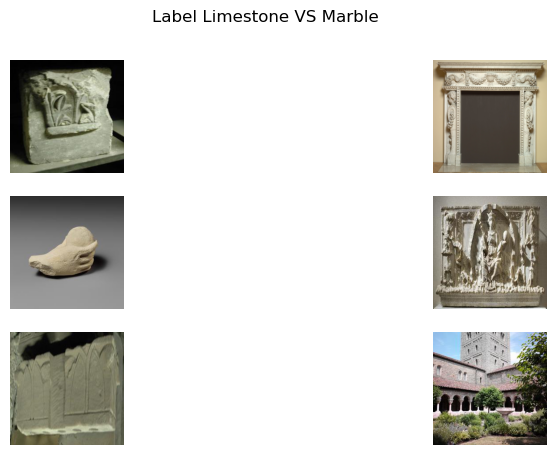

In [40]:
def plot_compare_classes(X, y, cat_name1, cat_name2, labels, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    fig, ax = plt.subplots(n_plots, 2, figsize=(10, 5))

    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        ax[i, 1].imshow(X_2[idx])
        ax[i, 1].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_classes(X_train, y_train, "Limestone", "Marble", labels=config.LABELS)

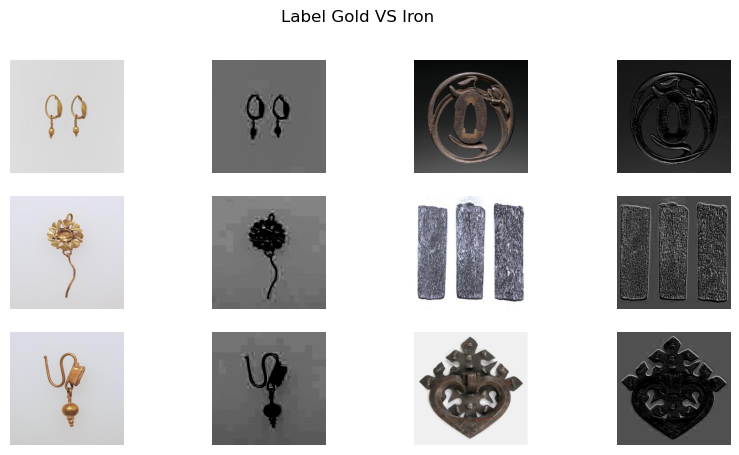

In [45]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

def plot_compare_activations(X, y, cat_name1, cat_name2, labels, model, n_plots=3):
    
    cat_idx1 = labels.index(cat_name1)
    cat_idx2 = labels.index(cat_name2)

    X_1, X_2 = X[y == cat_idx1], X[y == cat_idx2]
    rnd_idx = np.random.randint(0, min(X_1.shape[0], X_2.shape[0]), n_plots)
    
    fig, ax = plt.subplots(n_plots, 4, figsize=(10, 5))
    for i, idx in enumerate(rnd_idx):
        ax[i, 0].imshow(X_1[idx])
        ax[i, 0].axis('off')

        act_1 = get_layer_activations(X_1[idx], model)[1][0, :, :, 7]
        ax[i, 1].imshow(act_1, cmap='gray')
        ax[i, 1].axis('off')

        ax[i, 2].imshow(X_2[idx])
        ax[i, 2].axis('off')

        act_2 = get_layer_activations(X_2[idx], model)[1][0, :, :, 7]
        ax[i, 3].imshow(act_2, cmap='gray')
        ax[i, 3].axis('off')

    fig.suptitle(f"Label {cat_name1} VS {cat_name2}")
    plt.show()

plot_compare_activations(X_train, y_train, "Gold", "Iron", model=model, labels=config.LABELS)

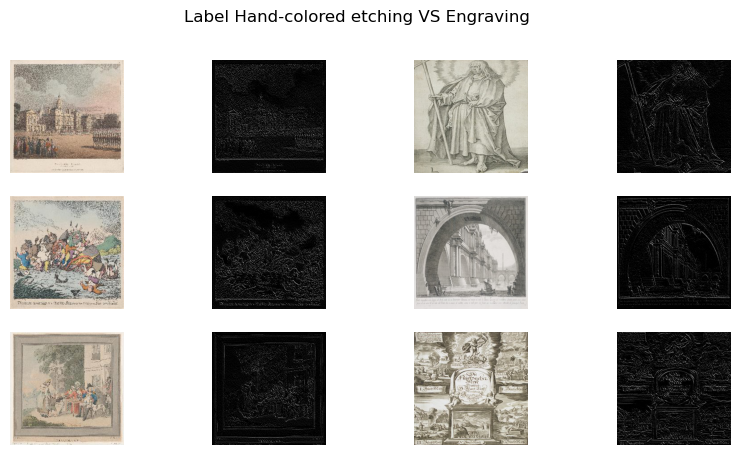

In [22]:
plot_compare_activations(X_train, y_train, "Hand-colored etching", "Engraving", model=model, labels=labels)

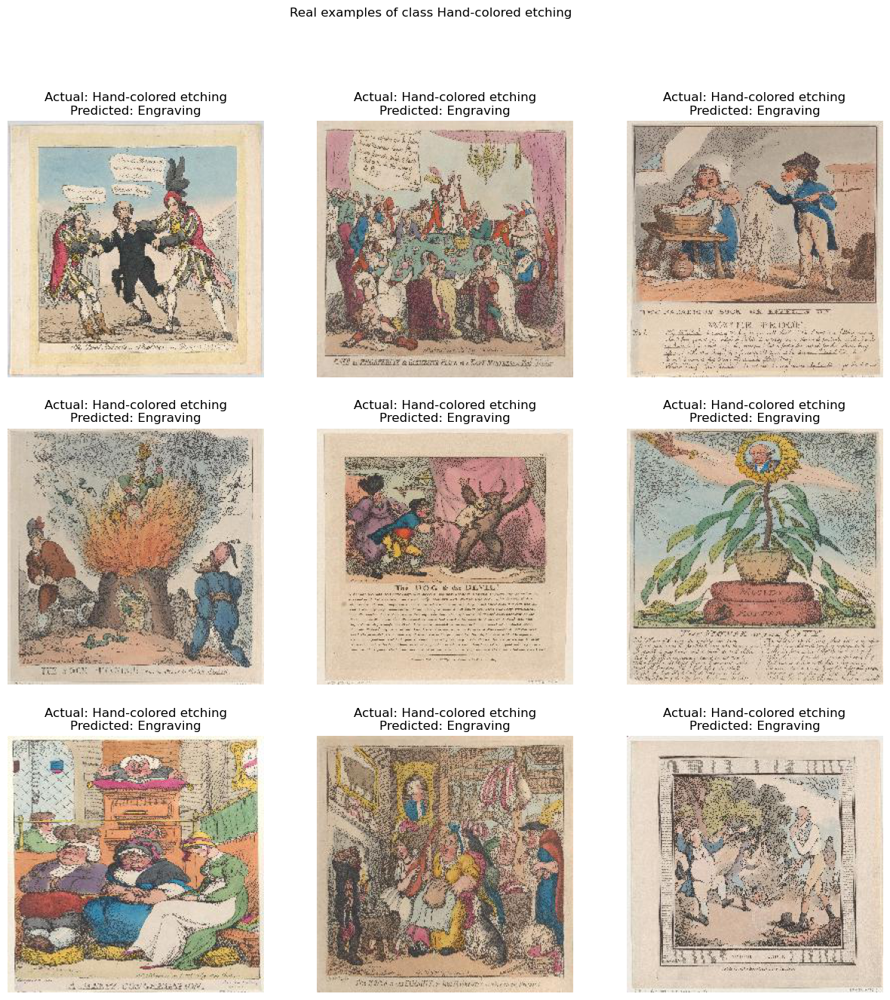

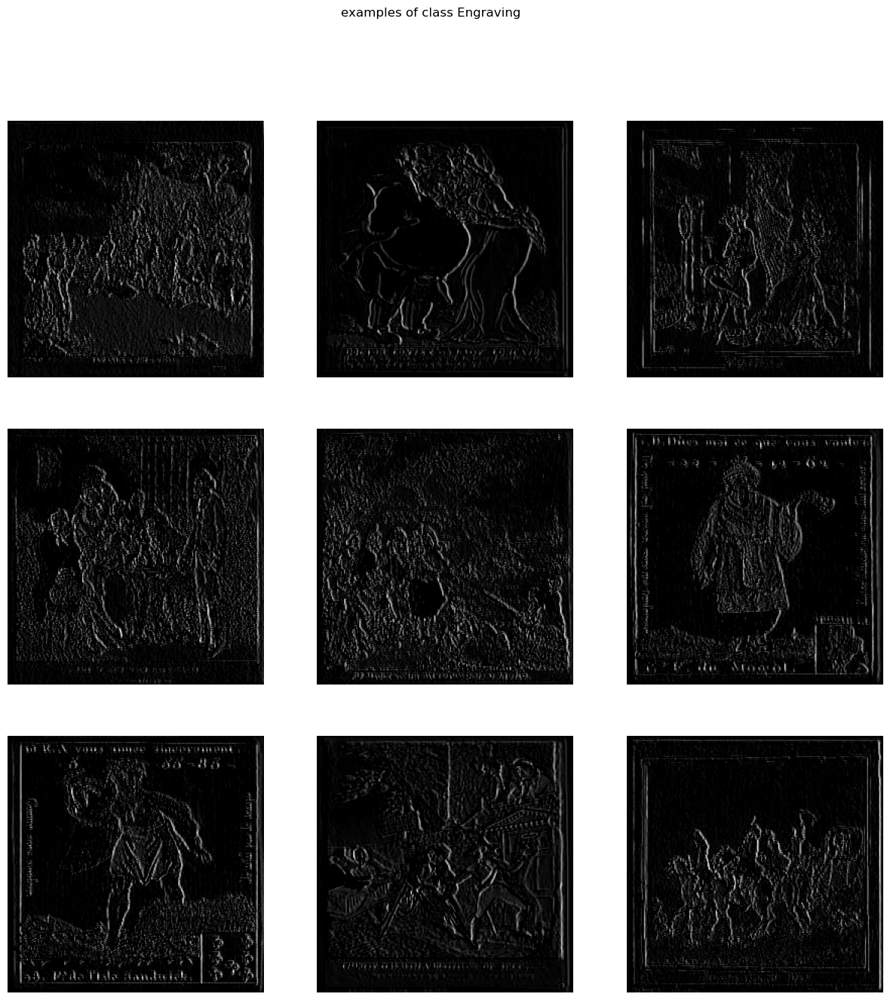

Text(0.5, 0.98, 'examples of class 4')

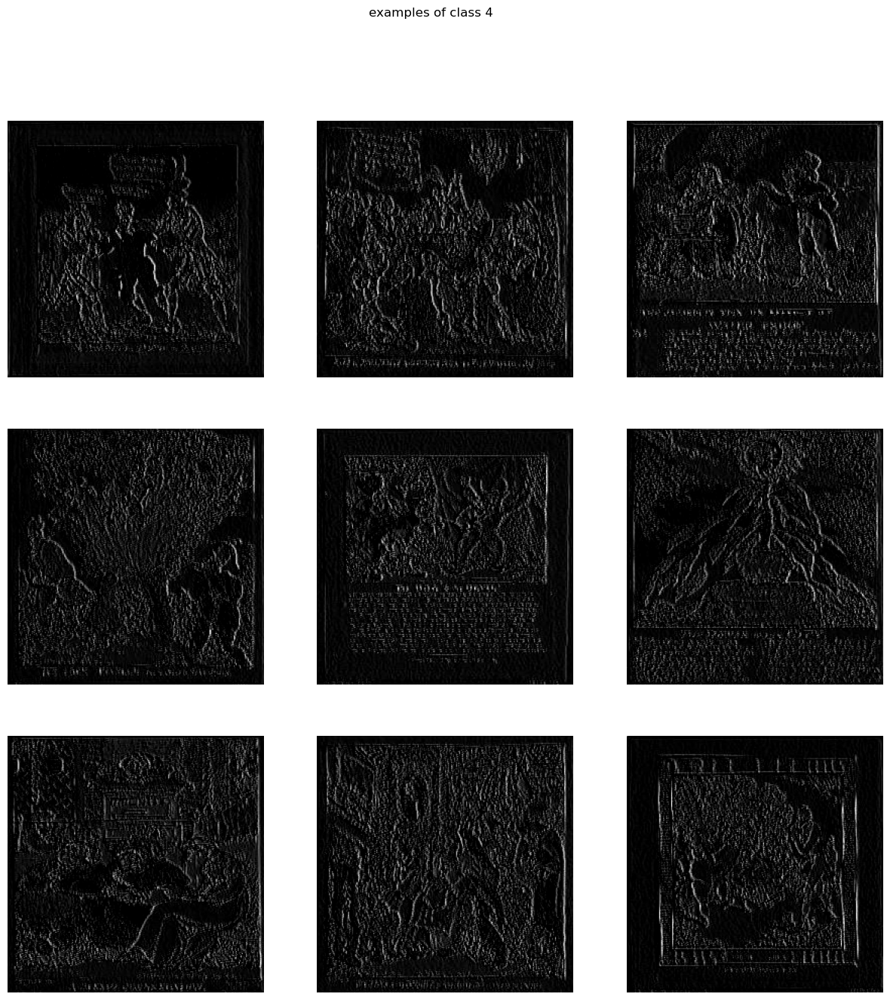

In [26]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

cat_pred_name = 'Engraving'
cat_real_name = 'Hand-colored etching'

cat_pred = labels.index(cat_pred_name)
cat_real = labels.index(cat_real_name)
X_wrong = X_train[(y_train == cat_real)&(y_pred == cat_pred)]    


# Print examples of the misclassified
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    ax[i//3, i%3].imshow(img)
    ax[i//3, i%3].set_title(f'Actual: {labels[cat_real]}\nPredicted: {labels[cat_pred]}')
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real_name}")
plt.show()

# Show the activations of the real class
X_real = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_real[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"examples of class {cat_pred_name}")
plt.show()

# SHow the activations of the class supposed by the model

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")

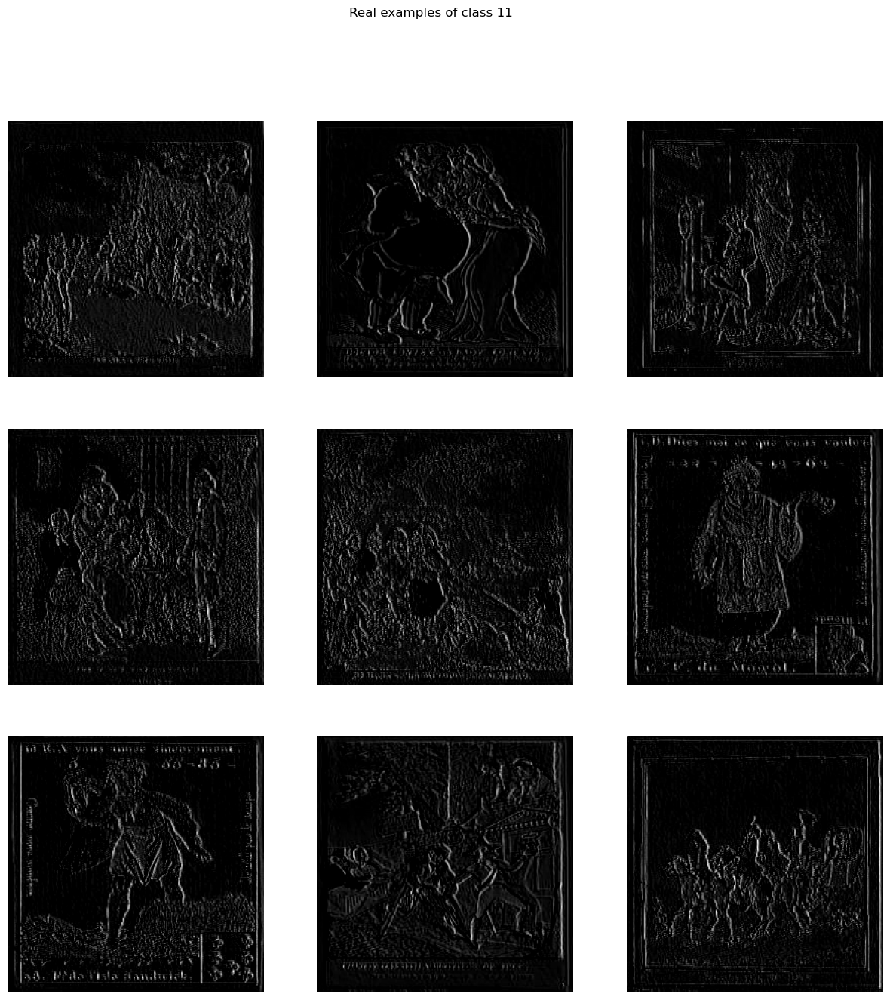

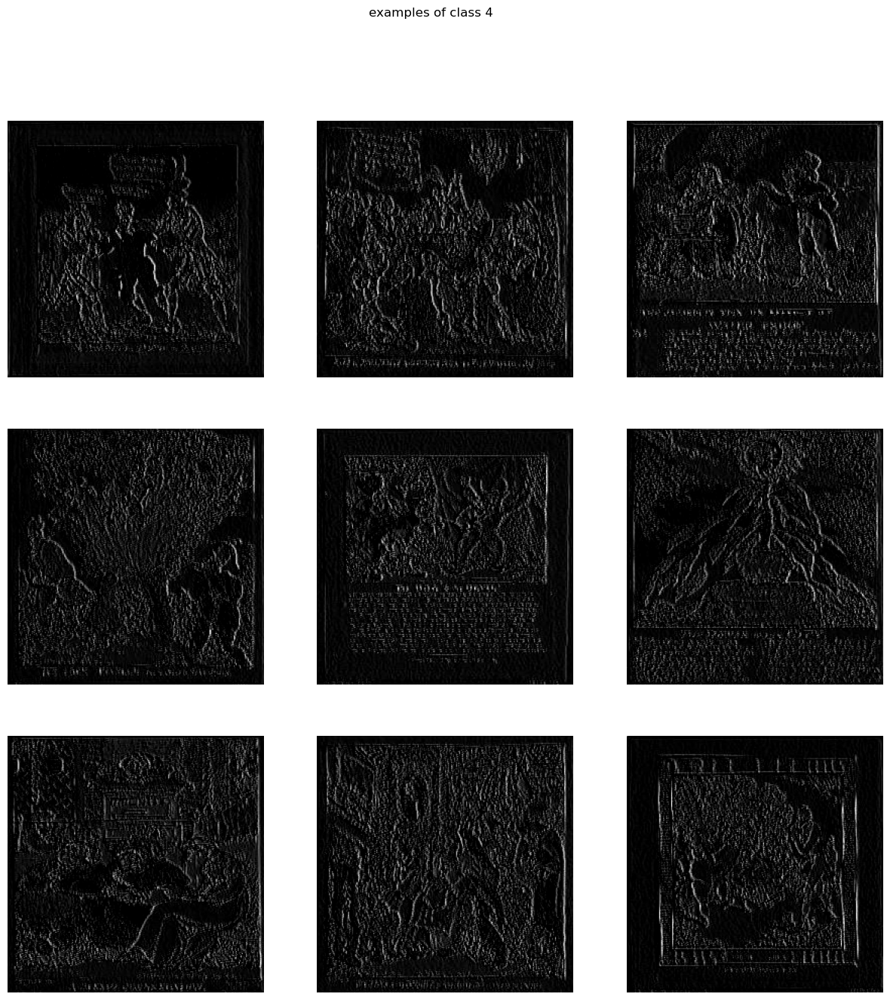

In [23]:
def get_layer_activations(Image_Tensor, model):
    Image_Tensor = tf.expand_dims(Image_Tensor, axis = 0)

    # Extract the Model Outputs for all the Layers
    Model_Outputs = [layer.output for layer in model.layers]
    # Create a Model with Model Input as Input and the Model Outputs as Output
    Activation_Model = Model(model.input, Model_Outputs)
    Activations = Activation_Model.predict(Image_Tensor, verbose=0)
    return Activations

X_ivory = X_train[y_train == cat_real]

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_ivory[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap="gray")
    ax[i//3, i%3].axis('off')
fig.suptitle(f"Real examples of class {cat_real}")
plt.show()

fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')

fig.suptitle(f"examples of class {cat_pred}")
plt.show()

1/1 [==============================] - 0s 30ms/step


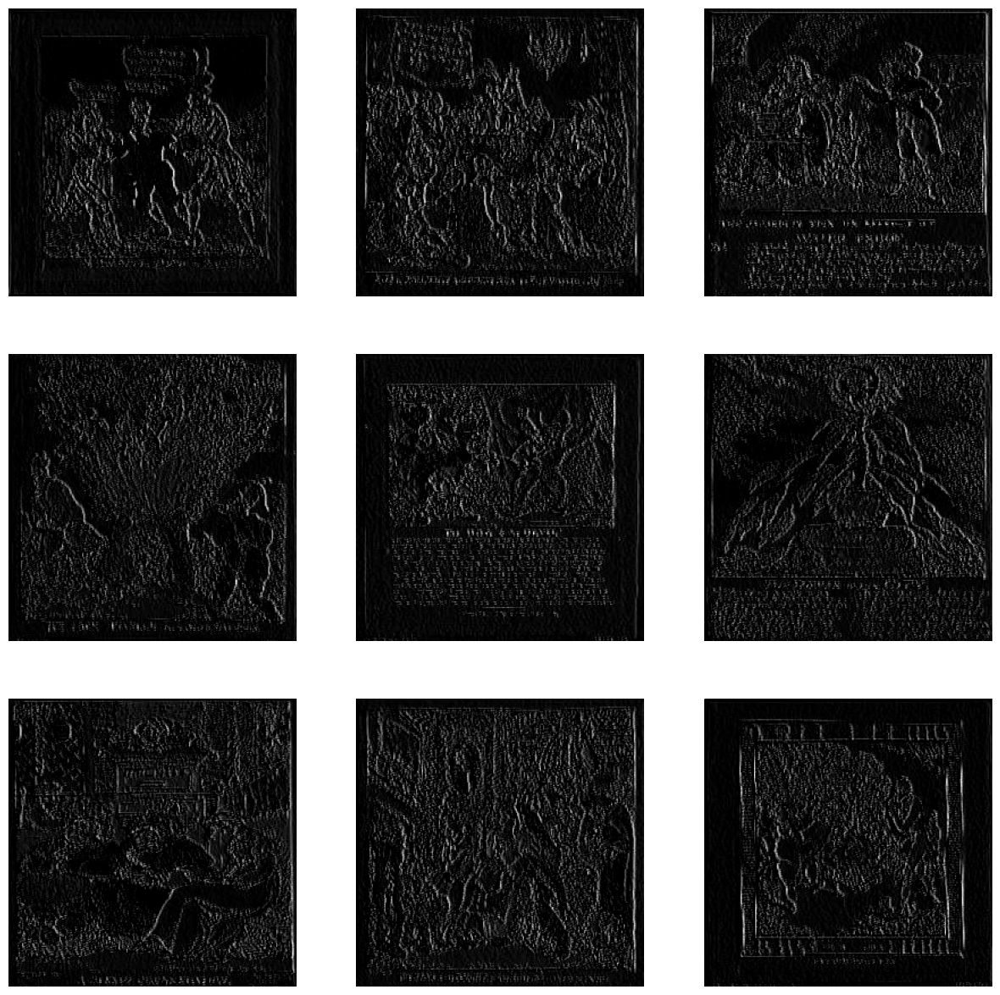

In [19]:
fig, ax = plt.subplots(3,3, figsize=(15,15))
for i, img in enumerate(X_wrong[:9]):
    act = get_layer_activations(img, model)[1][0, :, :, :];
    ax[i//3, i%3].imshow(act, cmap='gray')
    ax[i//3, i%3].axis('off')